
# **AI-powered Content Analysis and Recommendation**


# 📌 Step 1: Understanding the Dataset

In [1]:
import pandas as pd

df = pd.read_excel("Raw Data.xlsx")
df.head()


,title,text,url,authors,timestamp,tags,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 406,Unnamed: 407,Unnamed: 408,Unnamed: 409,Unnamed: 410,Unnamed: 411,Unnamed: 412,Unnamed: 413,Unnamed: 414,Unnamed: 415
0,Mental Note Vol. 24,Photo by Josh Riemer on Unsplash\n\nMerry Chri...,https://medium.com/invisible-illness/mental-no...,['Ryan Fan'],2020-12-26 03:38:10.479000+00:00,"['Mental Health', 'Health', 'Psychology', 'Sci...",NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Your Brain On Coronavirus,Your Brain On Coronavirus\n\nA guide to the cu...,https://medium.com/age-of-awareness/how-the-pa...,['Simon Spichak'],2020-09-23 22:10:17.126000+00:00,"['Mental Health', 'Coronavirus', 'Science', 'P...",NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Mind Your Nose,Mind Your Nose\n\nHow smell training can chang...,https://medium.com/neodotlife/mind-your-nose-f...,[],2020-10-10 20:17:37.132000+00:00,"['Biotechnology', 'Neuroscience', 'Brain', 'We...",NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,The 4 Purposes of Dreams,Passionate about the synergy between science a...,https://medium.com/science-for-real/the-4-purp...,['Eshan Samaranayake'],2020-12-21 16:05:19.524000+00:00,"['Health', 'Neuroscience', 'Mental Health', 'P...",NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Surviving a Rod Through the Head,"Youâ€™ve heard of him, havenâ€™t you? Phineas ...",https://medium.com/live-your-life-on-purpose/s...,['Rishav Sinha'],2020-02-26 00:01:01.576000+00:00,"['Brain', 'Health', 'Development', 'Psychology...",NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [2]:

# Check the shape (rows, columns)
print("\n📌 Dataset shape (rows, columns):", df.shape)




📌 Dataset shape (rows, columns): (309959, 416)


In [3]:
# Check column names and their data types
print("\n📌 Data types and non-null counts:")
print(df.info())



📌 Data types and non-null counts:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 309959 entries, 0 to 309958
Columns: 416 entries, title to Unnamed: 415
dtypes: object(416)
memory usage: 983.8+ MB
None


In [4]:

# Check for missing values per column
print("\n📌 Count of missing values per column:")
print(df.isnull().sum())




📌 Count of missing values per column:
title            59395
text             87696
url              97191
authors         103219
timestamp       107228
                 ...  
Unnamed: 411    309958
Unnamed: 412    309958
Unnamed: 413    309958
Unnamed: 414    309958
Unnamed: 415    309958
Length: 416, dtype: int64


# 📌 Step 2: Data Handling and preprocessing

In [6]:
# Drop columns starting with 'Unnamed'
df_cleaned = df.loc[:, ~df.columns.str.contains('^Unnamed')]

# Verify the columns after dropping
print("📌 Remaining columns after dropping 'Unnamed':")
print(df_cleaned.columns)

# Check missing values again after cleaning
print("\n📌 Missing values count after dropping unnamed columns:")
print(df_cleaned.isnull().sum())


📌 Remaining columns after dropping 'Unnamed':
Index(['title', 'text', 'url', 'authors', 'timestamp', 'tags'], dtype='object')

📌 Missing values count after dropping unnamed columns:
title         59395
text          87696
url           97191
authors      103219
timestamp    107228
tags         110258
dtype: int64


In [7]:
# List of key columns
key_columns = ['title', 'text', 'url', 'authors', 'timestamp', 'tags']

# Count rows where all key columns are empty (NaN)
empty_rows_count = df_cleaned[key_columns].isnull().all(axis=1).sum()

print(f"📌 Rows where all key columns are empty: {empty_rows_count}")


📌 Rows where all key columns are empty: 59320


In [8]:
# Drop rows where all key columns are missing
df_cleaned = df_cleaned.dropna(how='all', subset=key_columns)


In [11]:
print(df_cleaned.isnull().sum())

title           75
text         28376
url          37871
authors      43899
timestamp    47908
tags         50938
dtype: int64


In [13]:
# Drop rows where 'url' is missing
df_cleaned = df_cleaned.dropna(subset=['url'])

# Check remaining missing values after dropping
print("📌 Missing values after dropping rows with missing URLs:")
print(df_cleaned.isnull().sum())


📌 Missing values after dropping rows with missing URLs:
title           63
text             2
url              0
authors       6029
timestamp    10038
tags         13068
dtype: int64


In [14]:
import pandas as pd

# Define a regex pattern for Medium URLs
medium_pattern = r'^https?:\/\/([a-zA-Z0-9\-]+\.)?medium\.com\/.+'

# Identify URLs not matching Medium pattern (other domains)
non_medium_urls = df_cleaned[~df_cleaned['url'].str.match(medium_pattern, na=False)]

# Count of non-Medium URLs
count_non_medium = non_medium_urls.shape[0]

print(f"📌 Count of URLs not belonging to Medium: {count_non_medium}")

# Optional: URLs containing 'medium.com' but incorrect structure
incorrect_medium_urls = df_cleaned[
    (df_cleaned['url'].str.contains('medium.com', na=False)) &
    (~df_cleaned['url'].str.match(medium_pattern, na=False))
]

count_incorrect_medium = incorrect_medium_urls.shape[0]

print(f"📌 Count of Medium URLs with incorrect structure: {count_incorrect_medium}")


📌 Count of URLs not belonging to Medium: 33617
📌 Count of Medium URLs with incorrect structure: 9


In [15]:
# Define Medium URL regex pattern
medium_pattern = r'^https?:\/\/([a-zA-Z0-9\-]+\.)?medium\.com\/.+'

# Keep only correctly structured Medium URLs
df_cleaned = df_cleaned[df_cleaned['url'].str.match(medium_pattern, na=False)]

# Verify results
print(f"✅ Remaining rows after cleaning URLs: {df_cleaned.shape[0]}")

# Double-check missing values again
print("\n📌 Missing values after URL cleaning:")
print(df_cleaned.isnull().sum())


✅ Remaining rows after cleaning URLs: 179151

📌 Missing values after URL cleaning:
title        34
text          1
url           0
authors       0
timestamp     0
tags          0
dtype: int64


In [18]:
df_cleaned.shape

(179151, 6)

In [24]:
# Count rows where 'authors' is exactly the string "[]"
empty_authors_str_count = df_cleaned[df_cleaned['authors'] == "[]"].shape[0]
print(f"📌 Number of rows with authors = '[]': {empty_authors_str_count}")


📌 Number of rows with authors = '[]': 29921


In [25]:
import ast

def fix_authors(value):
    """
    Converts the string into a Python list,
    then replaces an empty list with ['Unknown'].
    """
    try:
        authors_list = ast.literal_eval(value)  # Convert "[]" → []
        if not authors_list:  # if it's an empty list
            return ["Unknown"]
        return authors_list
    except (ValueError, SyntaxError, TypeError):
        # If parsing fails or it's not a list, default to ['Unknown']
        return ["Unknown"]

# Apply to the DataFrame
df_cleaned['authors'] = df_cleaned['authors'].apply(fix_authors)

# Optional: Check the count of newly labeled 'Unknown'
unknown_authors_count = df_cleaned['authors'].apply(lambda x: x == ["Unknown"]).sum()
print(f"📌 Rows with imputed 'Unknown' authors: {unknown_authors_count}")


📌 Rows with imputed 'Unknown' authors: 29921


In [26]:
# Impute the single missing text value with "Unknown"
df_cleaned['text'] = df_cleaned['text'].fillna('Unknown')

# Verify there's no longer any missing text
print("📌 Missing values after text imputation:")
print(df_cleaned['text'].isnull().sum())  # Should be 0 now


📌 Missing values after text imputation:
0


In [28]:
import re

def extract_slug_from_url(url):
    """
    Extracts a rough 'slug' from a Medium URL.
    Example: https://medium.com/@author/my-article-12345 -> 'my-article-12345'
    If the pattern doesn't match, we return 'Unknown_Title'.
    """
    pattern = r'^https?://(?:[a-zA-Z0-9-]+\.)?medium\.com/(.*)$'
    match = re.match(pattern, url)
    if match:
        slug = match.group(1)
        # Optional: cleanup (replace hyphens with spaces, etc.)
        slug = slug.replace('-', ' ')
        return slug
    else:
        return "Unknown_Title"

# Identify missing titles
missing_title_mask = df_cleaned['title'].isnull()

# Impute missing titles from URL
df_cleaned.loc[missing_title_mask, 'title'] = df_cleaned[missing_title_mask]['url'].apply(extract_slug_from_url)

# Double-check how many titles remain missing
print("📌 Remaining missing titles after imputation:",
      df_cleaned['title'].isnull().sum())


📌 Remaining missing titles after imputation: 0


In [29]:
# 1. Save to CSV (without index)
df_cleaned.to_csv('cleaned_data.csv', index=False)

# 2. Save to Pickle
df_cleaned.to_pickle('cleaned_data.pkl')

print("✅ Data successfully saved as 'cleaned_data.csv' and 'cleaned_data.pkl'.")


✅ Data successfully saved as 'cleaned_data.csv' and 'cleaned_data.pkl'.


In [1]:
import pandas as pd
df = pd.read_csv("cleaned_data.csv")

df.info


<bound method DataFrame.info of                                             title  \
0                             Mental Note Vol. 24   
1                       Your Brain On Coronavirus   
2                                  Mind Your Nose   
3                        The 4 Purposes of Dreams   
4                Surviving a Rod Through the Head   
...                                           ...   
179146        Why do you need a cleaning service?   
179147  Daily cleaning and maintenance of bedding   
179148        Beneficial Advice on Bond Cleaning!   
179149    How I Learned Romanian in 37 Easy Steps   
179150     Trying Pimsleur Cantonese in Hong Kong   

                                                     text  \
0       Photo by Josh Riemer on Unsplash\n\nMerry Chri...   
1       Your Brain On Coronavirus\n\nA guide to the cu...   
2       Mind Your Nose\n\nHow smell training can chang...   
3       Passionate about the synergy between science a...   
4       Youâ€™ve heard of 

In [2]:
# Convert timestamp column to datetime
df['timestamp'] = pd.to_datetime(df['timestamp'], errors='coerce')

# Check if any conversion resulted in NaT
print("📌 Missing timestamps after conversion:", df['timestamp'].isnull().sum())


📌 Missing timestamps after conversion: 0


In [3]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import re

# One-time setup (if not already executed):
# nltk.download('stopwords')
# nltk.download('punkt')
# nltk.download('wordnet')

stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

def preprocess_text(text):
    if not isinstance(text, str):
        return ""
    
    # 1. Lowercasing
    text = text.lower()
    
    # 2. Removing non-alphabetic chars (retain spaces)
    text = re.sub(r'[^a-z\s]', '', text)
    
    # 3. Tokenization
    tokens = word_tokenize(text)
    
    # 4. Remove stopwords and short tokens
    tokens = [word for word in tokens if word not in stop_words and len(word) > 2]
    
    # 5. Lemmatization
    tokens = [lemmatizer.lemmatize(word) for word in tokens]
    
    # Return as a clean string or list of tokens
    return " ".join(tokens)

# Create a new column with processed text
df['processed_text'] = df['text'].apply(preprocess_text)


In [5]:
df['word_count'] = df['processed_text'].apply(lambda x: len(x.split()))
df = df[df['word_count'] >= 15]  # Example threshold


In [9]:
# Peek at the first 5 rows
print(df[['tags']].head(5))


                                                tags
0  ['Mental Health', 'Health', 'Psychology', 'Sci...
1  ['Mental Health', 'Coronavirus', 'Science', 'P...
2  ['Biotechnology', 'Neuroscience', 'Brain', 'We...
4  ['Brain', 'Health', 'Development', 'Psychology...
5  ['Society', 'Mental Health', 'Health', 'Nonfic...


In [15]:
print(df[['tags']].head(5))

                                                tags
0  ['Mental Health', 'Health', 'Psychology', 'Sci...
1  ['Mental Health', 'Coronavirus', 'Science', 'P...
2  ['Biotechnology', 'Neuroscience', 'Brain', 'We...
4  ['Brain', 'Health', 'Development', 'Psychology...
5  ['Society', 'Mental Health', 'Health', 'Nonfic...


# Outlier

In [8]:
import numpy as np
import pandas as pd

# Assume df_cleaned is your preprocessed DataFrame
df_cleaned = df.copy()
# 1. Calculate 'word_count'
#    We split on whitespace to get the approximate word count per article
df_cleaned['word_count'] = df_cleaned['text'].apply(lambda x: len(str(x).split()))

# Print shape before handling outliers
print("📌 Shape before outlier handling:", df_cleaned.shape)

# 2. Calculate IQR bounds
Q1 = df_cleaned['word_count'].quantile(0.25)
Q3 = df_cleaned['word_count'].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# 3. Detect outliers using the IQR method
outliers_mask = (df_cleaned['word_count'] < lower_bound) | (df_cleaned['word_count'] > upper_bound)
num_outliers = outliers_mask.sum()
print(f"📌 Detected {num_outliers} outliers using IQR method.")

# 4. Option 1: Drop outliers
df_no_outliers = df_cleaned[~outliers_mask].copy()
print("📌 Shape after dropping outliers:", df_no_outliers.shape)

# 5. Optional: Check descriptive statistics post-outlier removal
print("\n📌 Descriptive stats for 'word_count' after outlier removal:")
print(df_no_outliers['word_count'].describe())


📌 Shape before outlier handling: (174806, 8)
📌 Detected 8317 outliers using IQR method.
📌 Shape after dropping outliers: (166489, 8)

📌 Descriptive stats for 'word_count' after outlier removal:
count    166489.000000
mean        715.899963
std         492.754710
min          18.000000
25%         328.000000
50%         614.000000
75%        1009.000000
max        2212.000000
Name: word_count, dtype: float64


In [10]:
df_cleaned.to_csv('final_preprocessed_data.csv', index=False)
df_cleaned.to_pickle('final_preprocessed_data.pkl')

print("✅ Final preprocessed dataset saved!")


✅ Final preprocessed dataset saved!


In [45]:
# Shows the data types of all columns
print(df.dtypes)


title             object
text              object
url               object
authors           object
timestamp         object
tags              object
processed_text    object
word_count         int64
dtype: object


In [48]:
# Summary statistics
print("📌 Summary statistics for numeric columns:")
print(df_cleaned[['word_count']].describe())

# Calculate skewness and kurtosis
print("\n📌 Skewness of word_count:", df_cleaned['word_count'].skew())
print("📌 Kurtosis of word_count:", df_cleaned['word_count'].kurt())


📌 Summary statistics for numeric columns:
          word_count
count  176707.000000
mean      816.522243
std       705.203789
min        11.000000
25%       332.000000
50%       639.000000
75%      1083.000000
max      6302.000000

📌 Skewness of word_count: 2.0162001133487513
📌 Kurtosis of word_count: 6.076645898801784


# 📌 Step 3: EDA

📌 Basic statistics for 'word_count':
count    176707.000000
mean        816.522243
std         705.203789
min          11.000000
25%         332.000000
50%         639.000000
75%        1083.000000
max        6302.000000
Name: word_count, dtype: float64

📌 word_count Skewness: 2.0162001133487513
📌 word_count Kurtosis: 6.076645898801784


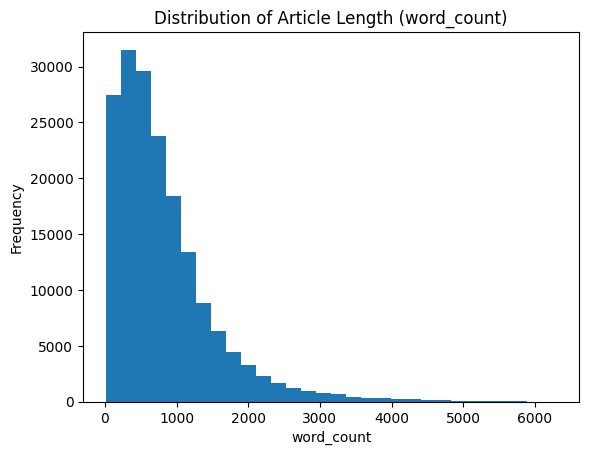

In [51]:
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter

# Assume df_cleaned is your DataFrame with columns:
# ['title','text','url','authors','timestamp','tags','processed_text','word_count']

# 1. ------------------ Numeric EDA for word_count ------------------ #
print("📌 Basic statistics for 'word_count':")
print(df_cleaned['word_count'].describe())

# Skewness and Kurtosis
print("\n📌 word_count Skewness:", df_cleaned['word_count'].skew())
print("📌 word_count Kurtosis:", df_cleaned['word_count'].kurt())

# Histogram of word_count
plt.hist(df_cleaned['word_count'], bins=30)
plt.title("Distribution of Article Length (word_count)")
plt.xlabel("word_count")
plt.ylabel("Frequency")
plt.show()


In [58]:
from collections import Counter

# 3. ------------------ Authors Exploration (Excluding "Unknown") ------------------ #
author_counts = Counter()

# Ensure 'authors' is a list in every row
df_cleaned['authors'] = df_cleaned['authors'].apply(
    lambda x: x if isinstance(x, list) else []
)

# Update counter with all authors except "Unknown"
for author_list in df_cleaned['authors']:
    author_counts.update(a for a in author_list if a != "Unknown")

# Get top 10 authors
top_10_authors = author_counts.most_common(10)
print("\n📌 Top 10 authors:")
for author, count in top_10_authors:
    print(f"{author}: {count}")



📌 Top 10 authors:
Are You Syrious: 204
John Au-Yeung: 163
The Good Men Project: 155
J.D. Harms: 152
Gaurav Shah: 138
Shamontiel L. Vaughn: 122
James Finn: 114
Pinterest Engineering: 112
C Y S: 106
Edie Tuck: 101


In [16]:

# 5. ------------------ Basic Word Frequency from processed_text ------------------ #
# 'processed_text' is presumably cleaned & tokenized. If not tokenized, adapt accordingly.
# If 'processed_text' is a string of space-separated tokens, we can simply split and count.
word_freq = Counter()
for text in df_cleaned['processed_text']:
    tokens = text.split()
    word_freq.update(tokens)

top_10_words = word_freq.most_common(10)
print("\n📌 Top 10 words in processed_text:")
for word, freq in top_10_words:
    print(f"{word}: {freq}")



📌 Top 10 words in processed_text:
one: 423918
time: 386663
like: 330896
people: 308002
make: 274778
also: 269187
get: 262475
need: 253343
would: 242183
new: 242118


In [29]:
import pandas as pd
from dateutil import parser

def force_timezone_aware(ts):
    try:
        # Parse timestamp and strip existing timezone
        dt = parser.parse(ts)
        if dt.tzinfo:
            # If already tz-aware, convert to UTC then drop timezone
            dt = dt.astimezone(pd.Timestamp.utcnow().tz).replace(tzinfo=None)
        return pd.Timestamp(dt).tz_localize('UTC')
    except:
        return pd.NaT  # If parsing fails

# Apply fix to the column
df['timestamp'] = df['timestamp'].apply(lambda x: force_timezone_aware(str(x)))
df['timestamp'] = df['timestamp'].dt.tz_convert('Asia/Bangkok')
print(df['timestamp'].dtype)

C:\Users\srikr\AppData\Local\Temp\ipykernel_19952\99430723.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



datetime64[ns, Asia/Bangkok]


C:\Users\srikr\AppData\Local\Temp\ipykernel_19952\99430723.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy




📌 Articles published per year:
1917         1
1941         1
1969         1
1985         1
1987         1
1991         1
1992         1
2003         1
2009         2
2011         1
2012         1
2013         1
2014         1
2015       614
2016      2462
2017      4189
2018      9128
2019     23901
2020    106192
2021     27999
2022       299
2025         1
Name: year, dtype: int64


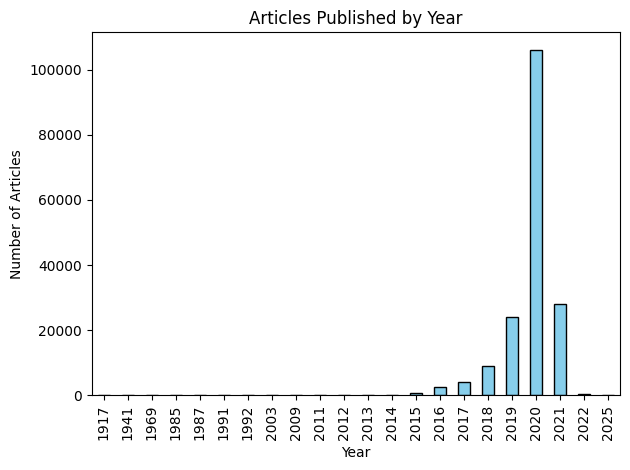

In [36]:
import matplotlib.pyplot as plt
import pandas as pd
from datetime import datetime

# 1. Convert 'timestamp' to datetime
df_cleaned['timestamp'] = pd.to_datetime(df_cleaned['timestamp'], errors='coerce')

# 2. Make all timestamps timezone-naive
df_cleaned['timestamp'] = df_cleaned['timestamp'].dt.tz_localize(None)

# 3. Drop rows with future timestamps
today = pd.Timestamp(datetime.today())
df_cleaned = df_cleaned[df_cleaned['timestamp'] <= today]

# 4. Extract year and count articles per year
df_cleaned['year'] = df_cleaned['timestamp'].dt.year
year_counts = df_cleaned['year'].value_counts().sort_index()
print("\n📌 Articles published per year:")
print(year_counts)

# 5. Plot
year_counts.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title("Articles Published by Year")
plt.xlabel("Year")
plt.ylabel("Number of Articles")
plt.tight_layout()
plt.show()


# 📌 Step 4: Data Visualization & Insight Extraction

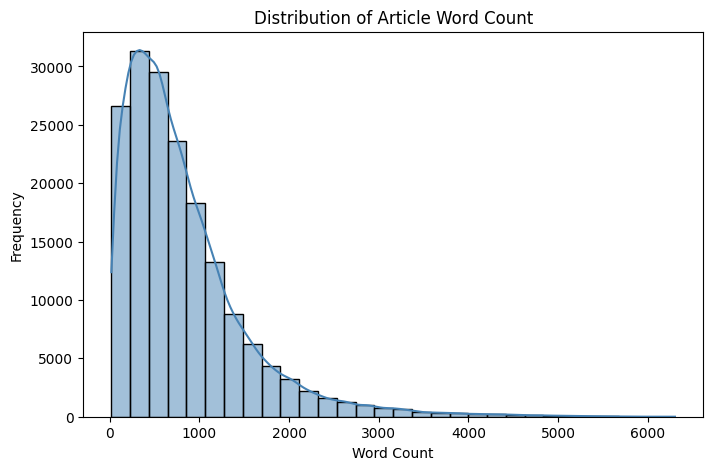

In [18]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
sns.histplot(df_cleaned['word_count'], bins=30, kde=True, color='steelblue')
plt.title("Distribution of Article Word Count")
plt.xlabel("Word Count")
plt.ylabel("Frequency")
plt.show()


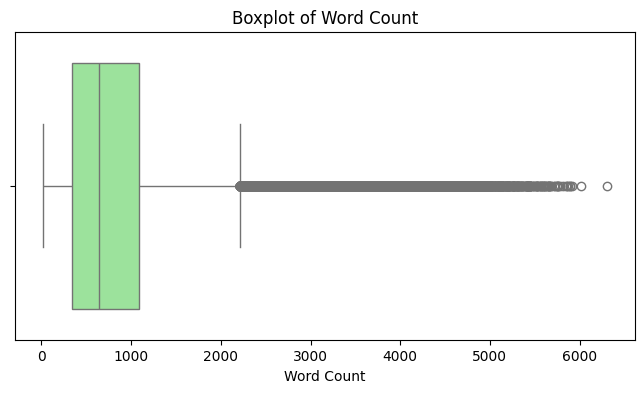

In [19]:
plt.figure(figsize=(8, 4))
sns.boxplot(x=df_cleaned['word_count'], color='lightgreen')
plt.title("Boxplot of Word Count")
plt.xlabel("Word Count")
plt.show()


In [26]:
top_authors = df_cleaned.groupby('authors')['word_count'].mean().sort_values(ascending=False).head(10).reset_index()

fig = px.bar(top_authors, x='authors', y='word_count',
             title='Top 10 Authors by Average Word Count',
             text='word_count', color='word_count')
fig.update_layout(xaxis_title='Author', yaxis_title='Avg Word Count')
fig.show()


In [32]:
df_cleaned=df.copy()
df_cleaned['year'] = pd.to_datetime(df_cleaned['timestamp'], errors='coerce').dt.year
top_authors = df_cleaned['authors'].value_counts().head(5).index
df_top_authors = df_cleaned[df_cleaned['authors'].isin(top_authors)]

fig = px.line(df_top_authors, x='year', color='authors', title='Articles Per Year by Top Authors')
fig.show()


In [37]:
import plotly.express as px

# Histogram
fig = px.histogram(df_cleaned, x='word_count', nbins=30, title="Interactive Word Count Distribution")
fig.show()

# Scatter Plot (now with 'year' present)
fig = px.scatter(df_cleaned, x='year', y='word_count', color='year',
                 title="Word Count Over Years", opacity=0.6)
fig.show()


 # 📌 Step 5: Feature Engineering

In [39]:
#Basic Feature Engineering
#Extract Reading Time (Assuming 200 words/minute)
df_cleaned['reading_time_min'] = (df_cleaned['word_count'] / 200).round(2)


In [40]:
#Compute Title and Text Length
df_cleaned['title_length'] = df_cleaned['title'].astype(str).apply(len)
df_cleaned['text_length'] = df_cleaned['text'].astype(str).apply(len)


In [41]:
#Sentiment Analysis

#Using TextBlob

from textblob import TextBlob

def get_sentiment(text):
    try:
        blob = TextBlob(text)
        return pd.Series([blob.sentiment.polarity, blob.sentiment.subjectivity])
    except:
        return pd.Series([0, 0])

df_cleaned[['polarity', 'subjectivity']] = df_cleaned['text'].astype(str).apply(get_sentiment)


In [42]:
#Using VADER (for short texts like title)

from nltk.sentiment.vader import SentimentIntensityAnalyzer
import nltk
nltk.download('vader_lexicon')

sid = SentimentIntensityAnalyzer()
df_cleaned['title_sentiment'] = df_cleaned['title'].astype(str).apply(lambda x: sid.polarity_scores(x)['compound'])


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\srikr\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [43]:
# TF-IDF Vectorization

from sklearn.feature_extraction.text import TfidfVectorizer

tfidf = TfidfVectorizer(max_features=500)
tfidf_matrix = tfidf.fit_transform(df_cleaned['processed_text'].astype(str))

# Convert to DataFrame and concatenate
tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=tfidf.get_feature_names_out())
df_combined = pd.concat([df_cleaned.reset_index(drop=True), tfidf_df.reset_index(drop=True)], axis=1)


In [44]:
#Feature Scaling

from sklearn.preprocessing import MinMaxScaler, StandardScaler

# Select numerical columns to scale
num_cols = ['word_count', 'reading_time_min', 'title_length', 'text_length', 'polarity', 'subjectivity', 'title_sentiment']

# Min-Max Scaling
minmax_scaled = MinMaxScaler().fit_transform(df_cleaned[num_cols])
df_minmax = pd.DataFrame(minmax_scaled, columns=[col + '_minmax' for col in num_cols])

# Standard Scaling
standard_scaled = StandardScaler().fit_transform(df_cleaned[num_cols])
df_standard = pd.DataFrame(standard_scaled, columns=[col + '_std' for col in num_cols])

# Merge with original
df_cleaned_scaled = pd.concat([df_cleaned.reset_index(drop=True), df_minmax, df_standard], axis=1)


In [45]:
df_cleaned.to_csv('final_data.csv', index=False)